In [12]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
# Import all modules used
import pandas as pd
import numpy as np
from numpy import linalg as LA
from datetime import datetime
from itertools import cycle
from scipy.spatial import distance_matrix
from scipy.sparse import csgraph
import matplotlib.pyplot as plt
import analysis
import matplotlib.ticker as ticker
import matplotlib as mpl
import pickle
mpl.rcParams["figure.facecolor"] = "white"
mpl.rcParams["axes.facecolor"] = "white"
mpl.rcParams["savefig.facecolor"] = "white"
plt.rcParams["figure.figsize"] =(12,9) 

In [3]:
# Import data in a sane format
# Data Ranges from 08-15-2015 00:00:00 to 07-09-2016
data = analysis.createdf("../data/environmental/PNI16_Temperature_2015-2016_V2.xlsx")
data_by_days = [data[48*i:48*i+48] for i in range(341)]

In [4]:
ten_meter_by_days = [days['10m'].values.tolist() for days in data_by_days]
thirty_meter_by_days = [days['30m'].values.tolist() for days in data_by_days]
fourty_meter_by_days = [days['40m'].values.tolist() for days in data_by_days]
sixty_meter_by_days = [days['60m'].values.tolist() for days in data_by_days]
seventy_meter_by_days = [days['70m'].values.tolist() for days in data_by_days]
eighty_meter_by_days = [days['80m'].values.tolist() for days in data_by_days]
ninety_meter_by_days = [days['90m'].values.tolist() for days in data_by_days]
hundred_twenty_meter_by_days = [days['120m'].values.tolist() for days in data_by_days]
hundred_thirty_meter_by_days = [days['130m'].values.tolist() for days in data_by_days]

In [55]:
#Dumping station
pickle.dump(analysis.distance_matrix(ten_meter_by_days[:-1]),open("../data/environmental/day_v_day_ten_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(thirty_meter_by_days[:-1]),open("../data/environmental/day_v_day_thirty_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(fourty_meter_by_days[:-1]),open("../data/environmental/day_v_day_fourty_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(sixty_meter_by_days[:-1]),open("../data/environmental/day_v_day_sixty_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(seventy_meter_by_days[:-1]),open("../data/environmental/day_v_day_seventy_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(eighty_meter_by_days[:-1]),open("../data/environmental/day_v_day_eighty_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(ninety_meter_by_days[:-1]),open("../data/environmental/day_v_day_ninety_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(hundred_twenty_meter_by_days[:-1]),open("../data/environmental/day_v_day_hundred_twenty_meter_distance.p","wb"))
pickle.dump(analysis.distance_matrix(hundred_thirty_meter_by_days[:-1]),open("../data/environmental/day_v_day_hundred_thirty_meter_distance.p","wb"))

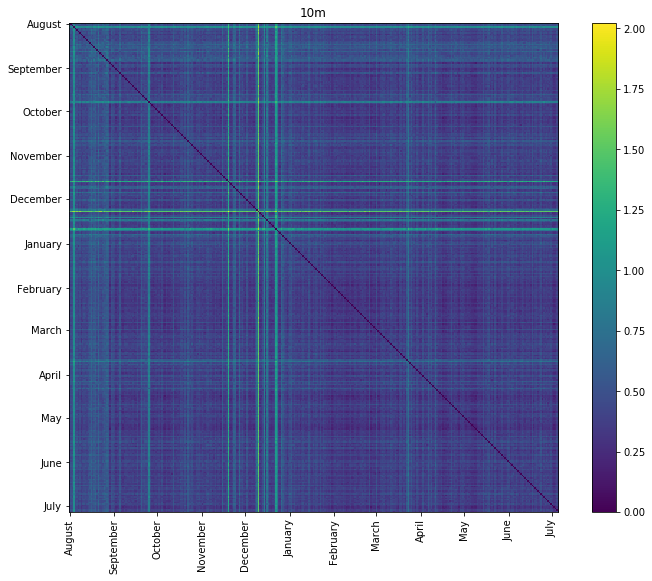

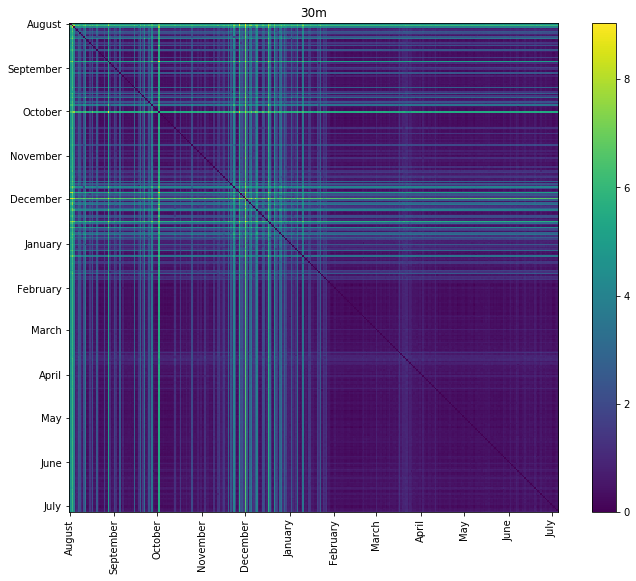

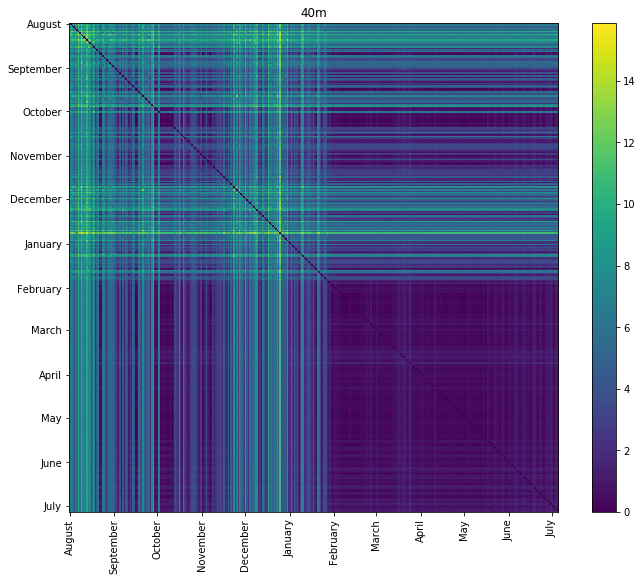

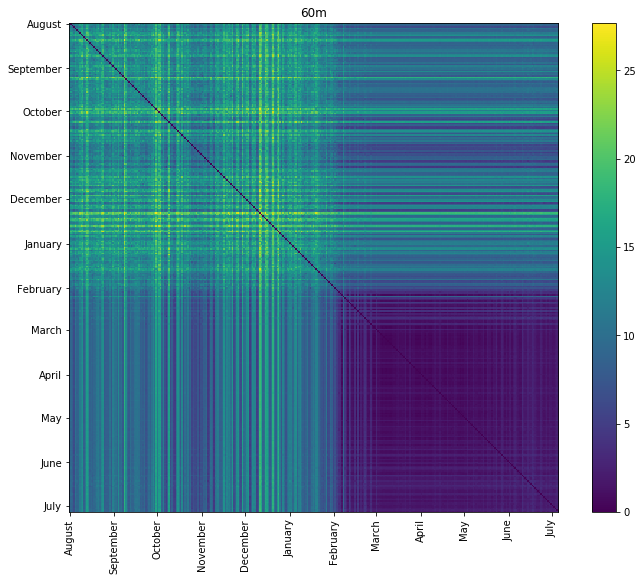

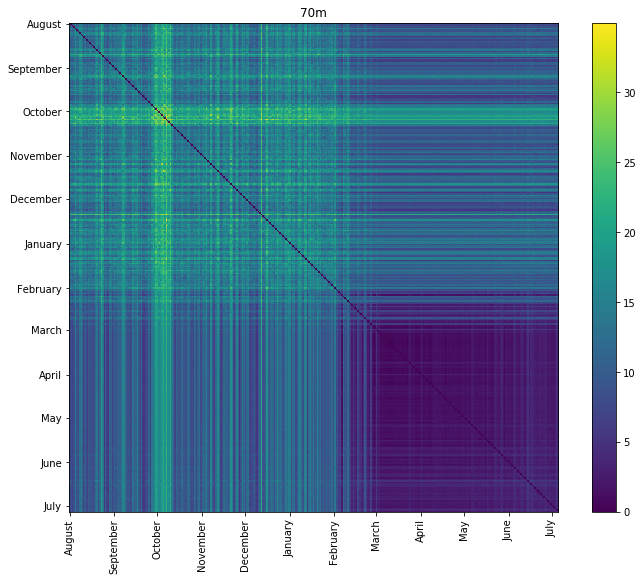

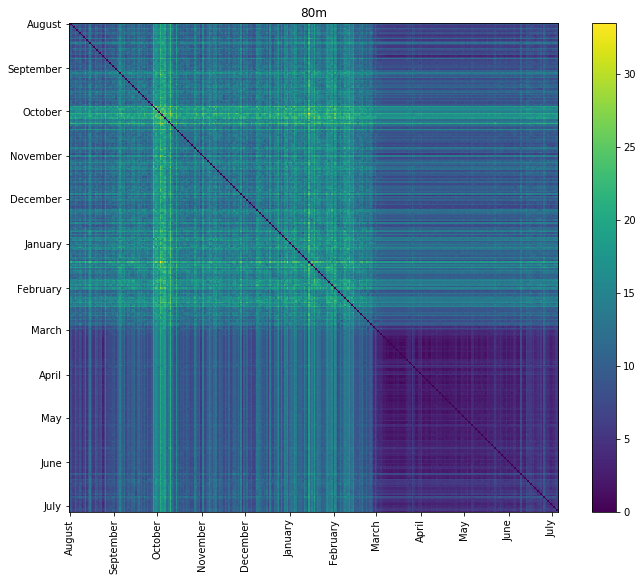

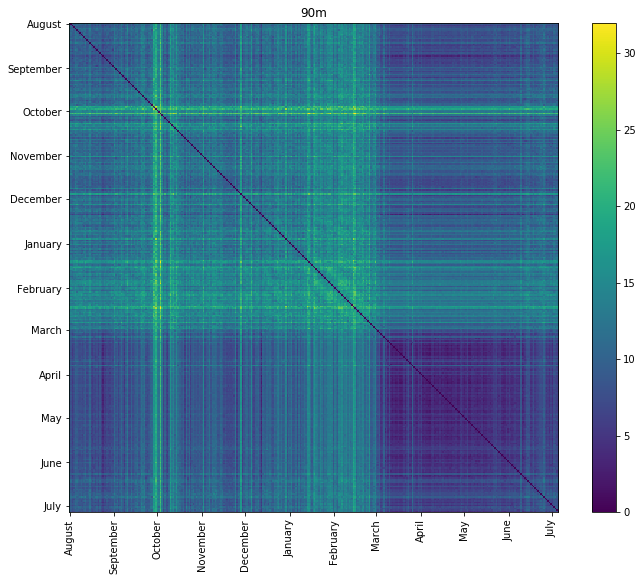

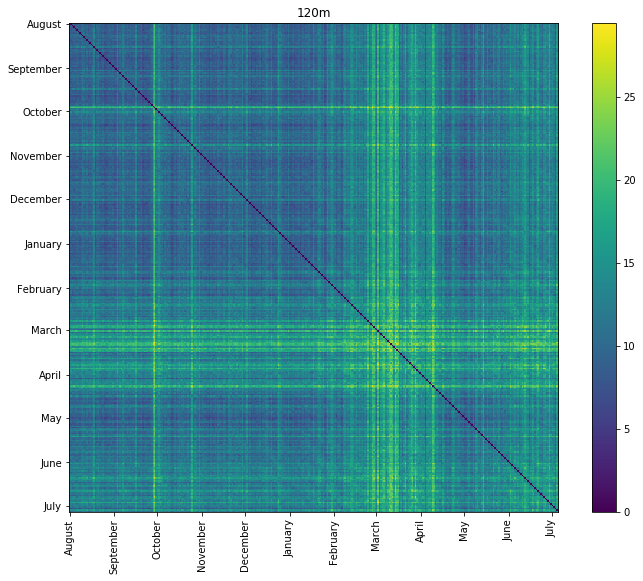

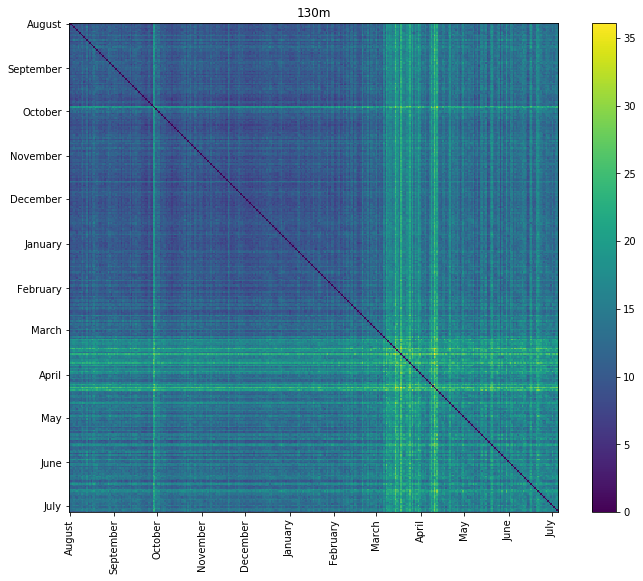

In [69]:
# Cubic Spline Part only
analysis.plotter(analysis.distance_matrix(ten_meter_by_days[:-1]),data.columns.tolist(),"10m")
analysis.plotter(analysis.distance_matrix(thirty_meter_by_days[:-1]),data.columns.tolist(),"30m")
analysis.plotter(analysis.distance_matrix(fourty_meter_by_days[:-1]),data.columns.tolist(),"40m")
analysis.plotter(analysis.distance_matrix(sixty_meter_by_days[:-1]),data.columns.tolist(),"60m")
analysis.plotter(analysis.distance_matrix(seventy_meter_by_days[:-1]),data.columns.tolist(),"70m")
analysis.plotter(analysis.distance_matrix(eighty_meter_by_days[:-1]),data.columns.tolist(),"80m")
analysis.plotter(analysis.distance_matrix(ninety_meter_by_days[:-1]),data.columns.tolist(),"90m")
analysis.plotter(analysis.distance_matrix(hundred_twenty_meter_by_days[:-1]),data.columns.tolist(),"120m")
analysis.plotter(analysis.distance_matrix(hundred_thirty_meter_by_days[:-1]),data.columns.tolist(),"130m")

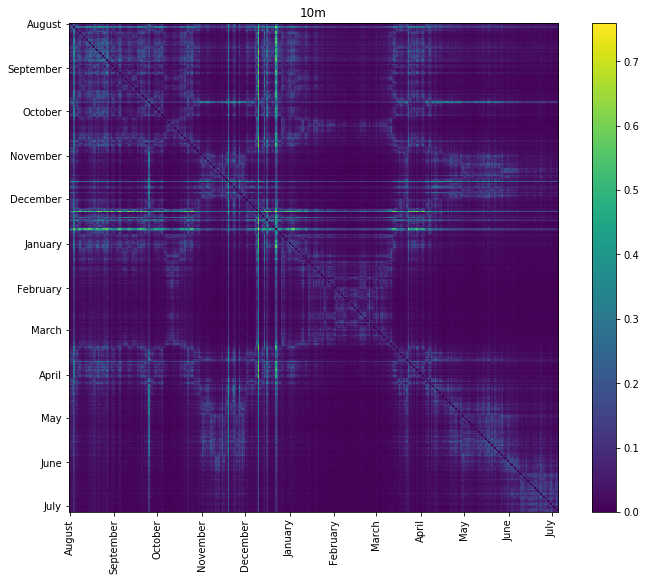

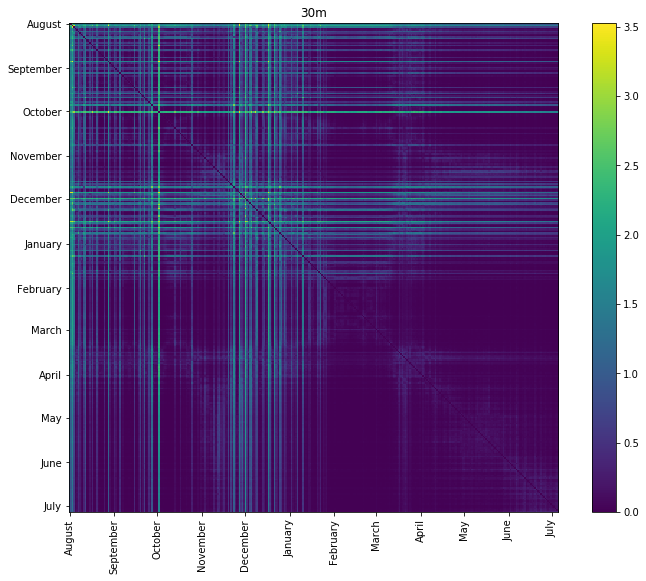

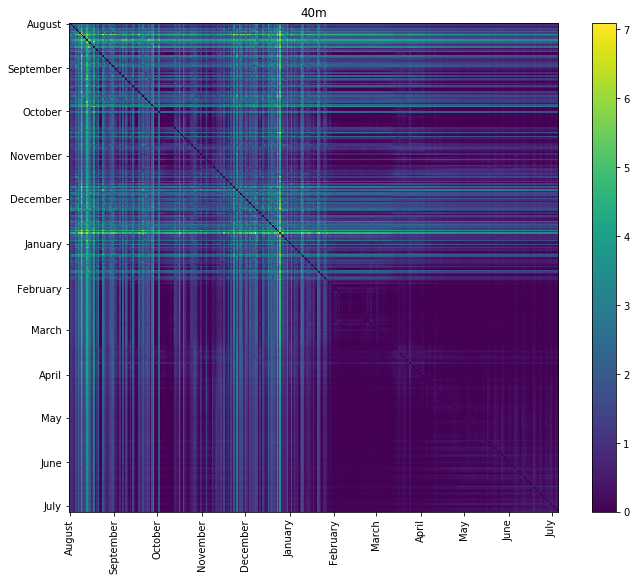

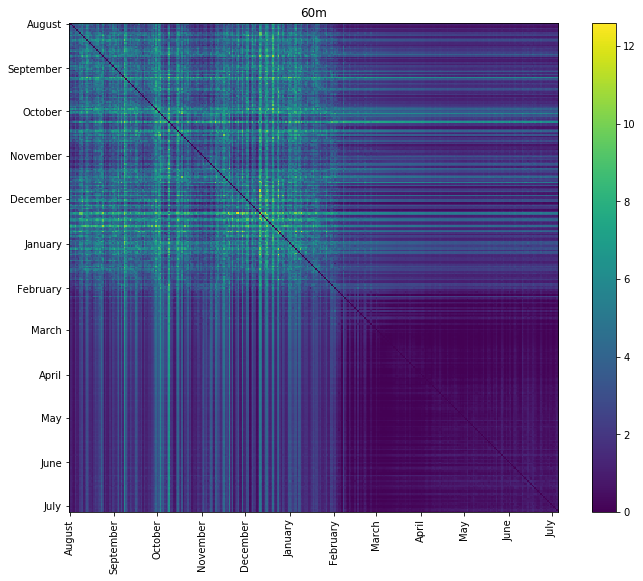

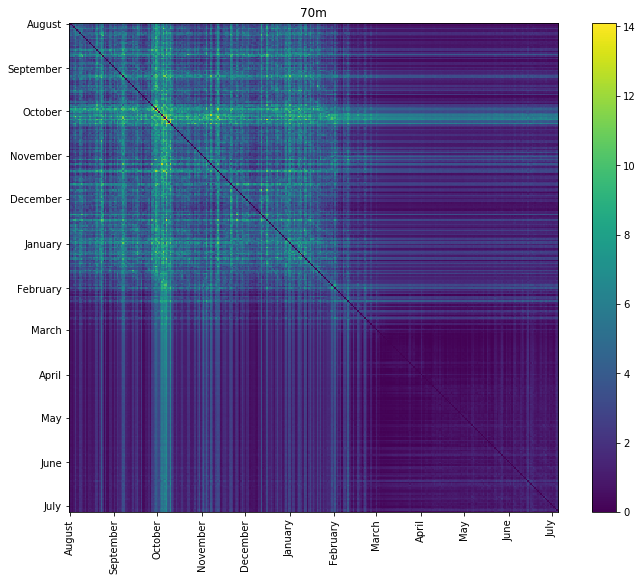

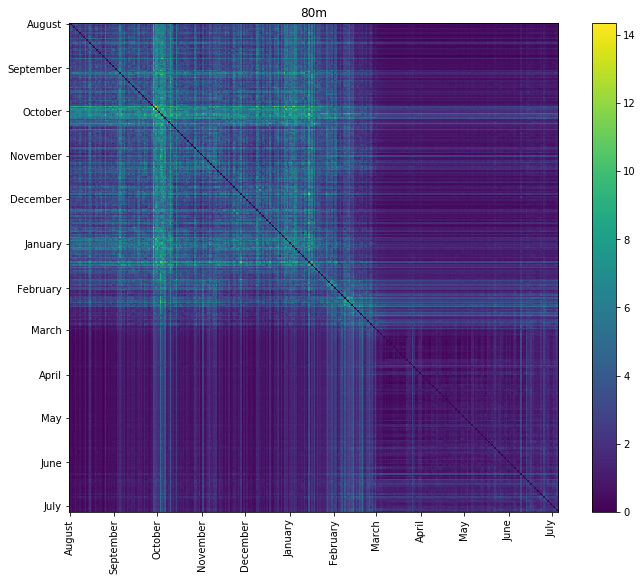

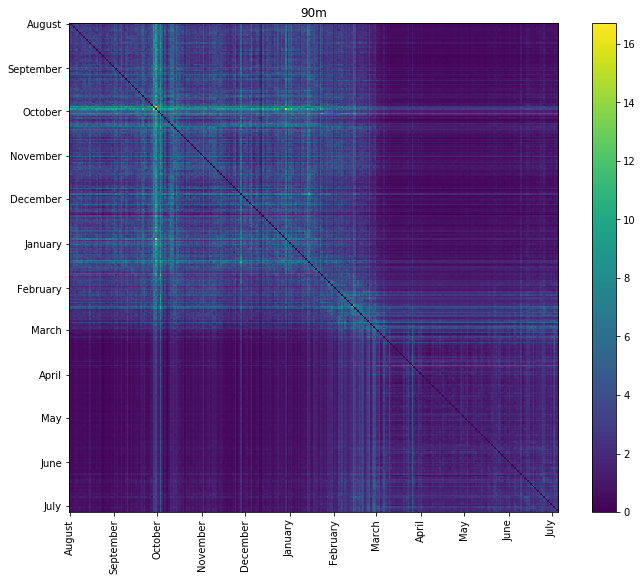

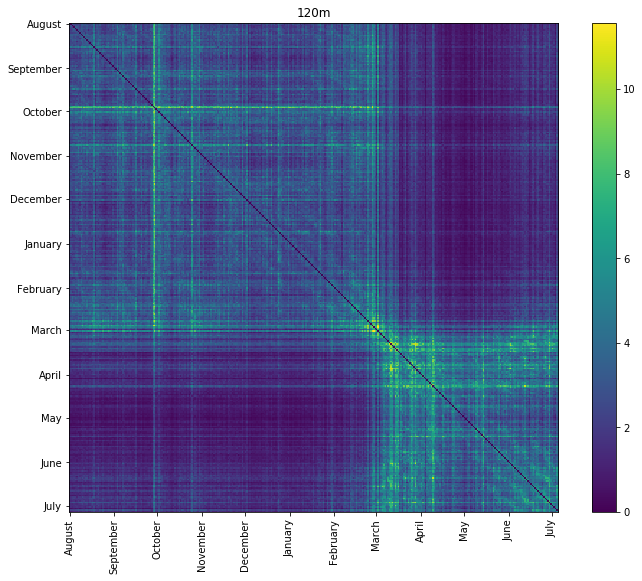

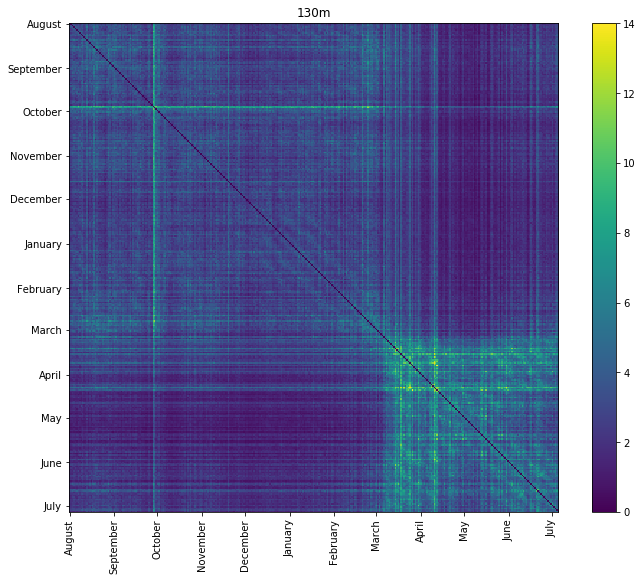

In [ ]:
#Difference between Spline and nonspline metrics
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_ten_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_ten_meter_distance.p",'rb')),data.columns.tolist(),"10m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_thirty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_thirty_meter_distance.p",'rb')),data.columns.tolist(),"30m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_fourty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_fourty_meter_distance.p",'rb')),data.columns.tolist(),"40m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_sixty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_sixty_meter_distance.p",'rb')),data.columns.tolist(),"60m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_seventy_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_seventy_meter_distance.p",'rb')),data.columns.tolist(),"70m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_eighty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_eighty_meter_distance.p",'rb')),data.columns.tolist(),"80m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_ninety_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_ninety_meter_distance.p",'rb')),data.columns.tolist(),"90m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_hundred_twenty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_hundred_twenty_meter_distance.p",'rb')),data.columns.tolist(),"120m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_hundred_thirty_meter_distance.p",'rb'))-pickle.load(open("../data/environmental/day_v_day_hundred_thirty_meter_distance.p",'rb')),data.columns.tolist(),"130m")

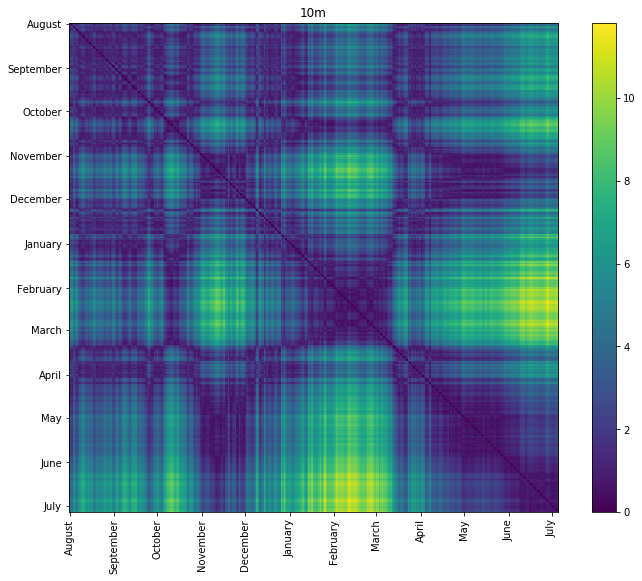

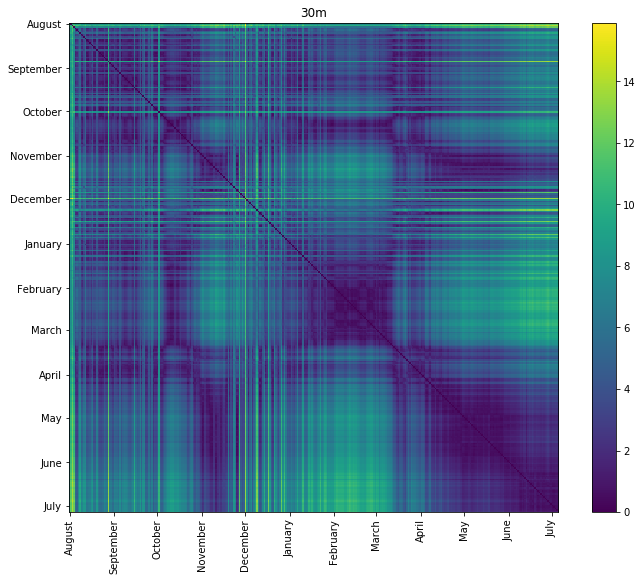

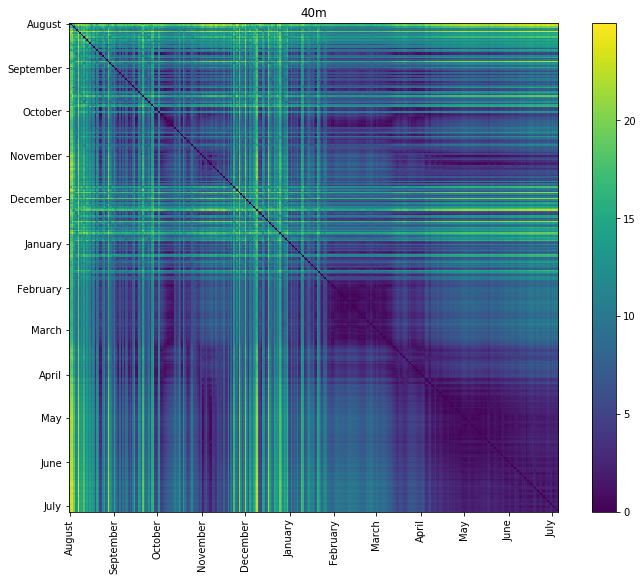

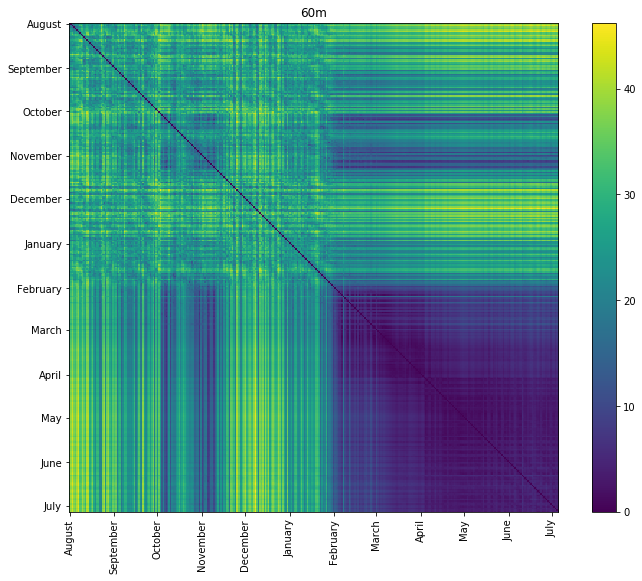

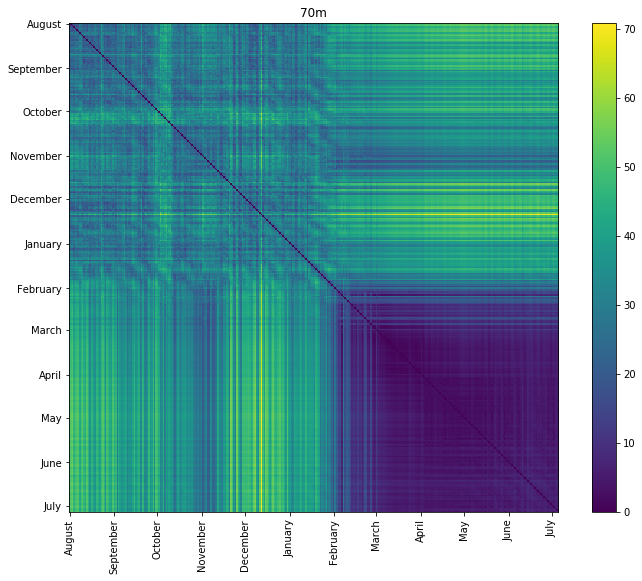

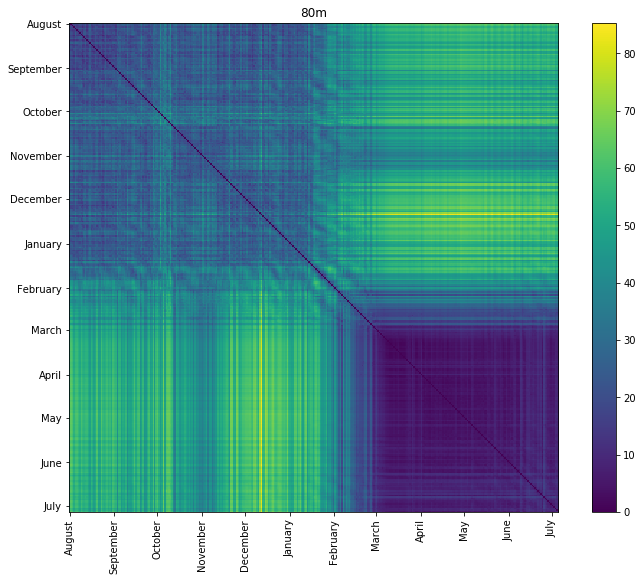

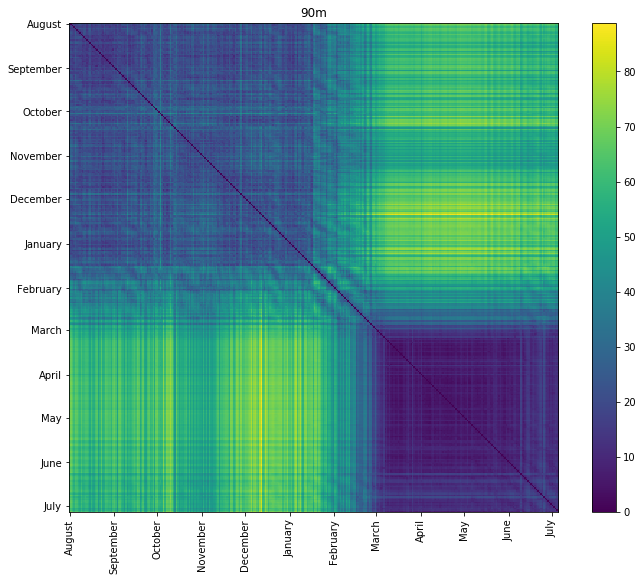

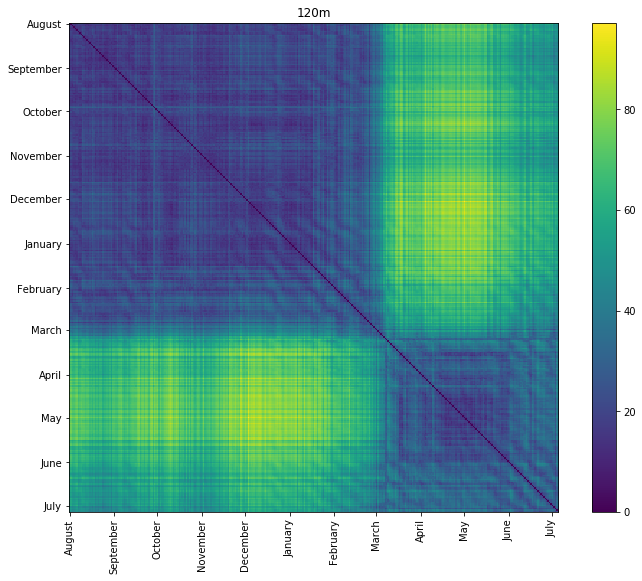

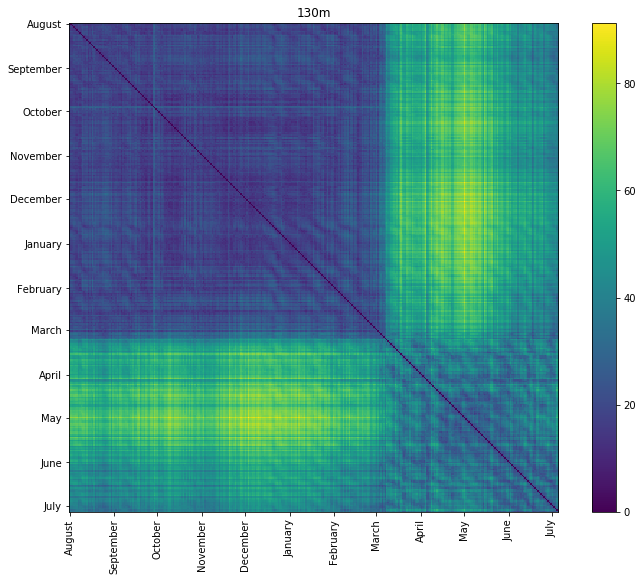

In [72]:
# Day v Day norm By depth
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_ten_meter_distance.p",'rb')),data.columns.tolist(),"10m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_thirty_meter_distance.p",'rb')),data.columns.tolist(),"30m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_fourty_meter_distance.p",'rb')),data.columns.tolist(),"40m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_sixty_meter_distance.p",'rb')),data.columns.tolist(),"60m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_seventy_meter_distance.p",'rb')),data.columns.tolist(),"70m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_eighty_meter_distance.p",'rb')),data.columns.tolist(),"80m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_ninety_meter_distance.p",'rb')),data.columns.tolist(),"90m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_hundred_twenty_meter_distance.p",'rb')),data.columns.tolist(),"120m")
analysis.plotter(pickle.load(open("../data/environmental/spline_day_v_day_hundred_thirty_meter_distance.p",'rb')),data.columns.tolist(),"130m")

In [8]:
#analysis.plotter(analysis.distance_matrix(data_by_days[0].T.values),data.columns.tolist(),"August")
.
#analysis.plotter(analysis.distance_matrix(data_by_days[31].T.values),data.columns.tolist(),"September")
##analysis.plotter(analysis.distance_matrix(data_by_days[61].T.values),data.columns.tolist(),"October")
#analysis.plotter(analysis.distance_matrix(data_by_days[92].T.values),data.columns.tolist(),"November")
#analysis.plotter(analysis.distance_matrix(data_by_days[122].T.values),data.columns.tolist(),"December")
#analysis.plotter(analysis.distance_matrix(data_by_days[153].T.values),data.columns.tolist(),"January")
#analysis.plotter(analysis.distance_matrix(data_by_days[184].T.values),data.columns.tolist(),"February")
#analysis.plotter(analysis.distance_matrix(data_by_days[213].T.values),data.columns.tolist(),"March")
#analysis.plotter(analysis.distance_matrix(data_by_days[244].T.values),data.columns.tolist(),"April")
#analysis.plotter(analysis.distance_matrix(data_by_days[274].T.values),data.columns.tolist(),"May")
#analysis.plotter(analysis.distance_matrix(data_by_days[305].T.values),data.columns.tolist(),"June")
#analysis.plotter(analysis.distance_matrix(data_by_days[335].T.values),data.columns.tolist(),"July")

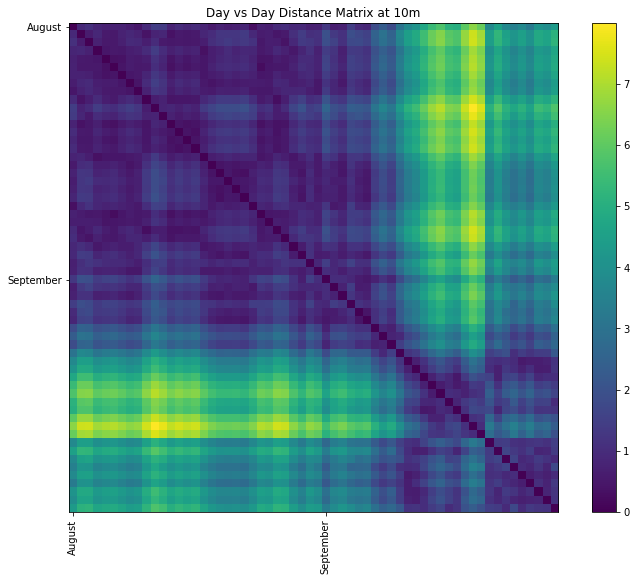

In [15]:
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.imshow(ten_meter_distances, interpolation='nearest')
fig.colorbar(cax)
ax.set_title("Day vs Day Distance Matrix at 10m")
ax.xaxis.set_major_locator(ticker.FixedLocator([0,31,61,92,122,153,184,213,244,274,305,335]))
ax.yaxis.set_major_locator(ticker.FixedLocator([0,31,61,92,122,153,184,213,244,274,305,335]))
ax.set_yticklabels(["August","September","October","November","December","January","February","March","April","May","June","July"])
ax.set_xticklabels(["August","September","October","November","December","January","February","March","April","May","June","July"])
plt.xticks(rotation='vertical')
plt.show()

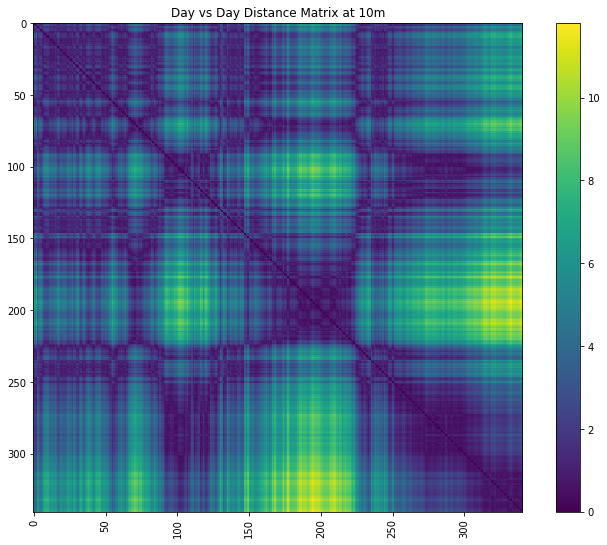

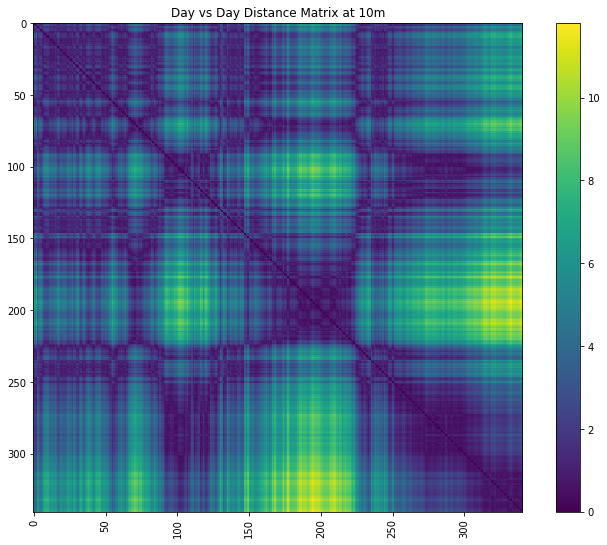

In [17]:
ten_meter_distances = analysis.distance_matrix(ten_meter_by_days)

fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.imshow(ten_meter_distances, interpolation='nearest')
fig.colorbar(cax)
ax.set_title("Day vs Day Distance Matrix at 10m")
#ax.xaxis.set_major_locator(ticker.FixedLocator([0,200,300]))
#ax.yaxis.set_major_locator(ticker.FixedLocator([0,200,300]))
plt.xticks(rotation='vertical')
plt.show()

IndexError: index 200 is out of bounds for axis 0 with size 60

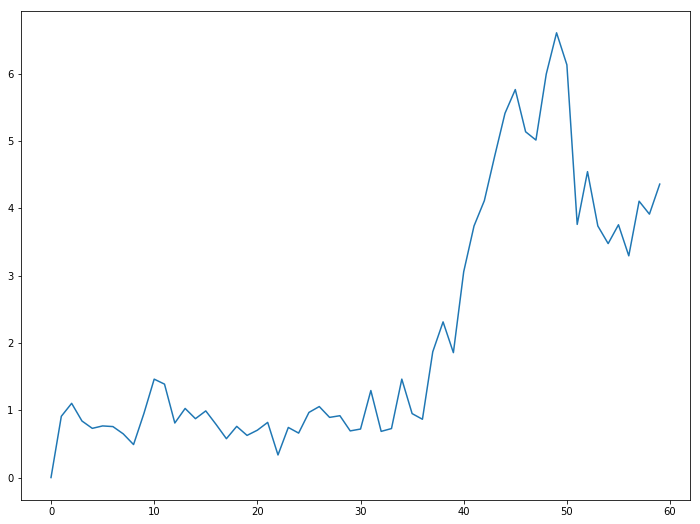

IndexError: index 200 is out of bounds for axis 0 with size 60

In [11]:
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(ten_meter_distances[0])
ax.legend(["August 5, 2015","February 21, 2016","May 31, 2016"],bbox_to_anchor=(1,1))

#for i in range(len(ten_meter_distances)):
#    plt.plot(ten_meter_distances[i])

[-6.89647601e-02  1.29099445e-01  4.48644229e-02  3.07327909e-02
 -2.68753821e-02  4.33940179e-02 -2.29051325e-02  3.13118173e-02
 -3.45778407e-02 -2.94511751e-02 -2.35348228e-03 -3.92904020e-02
 -5.27171643e-03  9.03516507e-03 -1.03427305e-02  5.34412407e-03
  2.21502775e-02  3.19667034e-02 -1.26316586e-02  2.83391856e-02
  1.47579061e-02 -5.88586413e-02 -4.77770518e-02 -6.80954571e-03
  6.86316336e-02 -9.52151811e-01 -6.37698489e-02  1.52959412e-01
  4.95509528e-02 -3.90768246e-02  7.60879141e-02  8.88261143e-02
 -9.58978010e-03  2.09453040e-04  3.19391517e-04  1.06840282e-04
 -9.76366454e-04  5.41065280e-04 -5.78394812e-03  1.10661183e-03
 -3.22370962e-03  5.94718336e-04  5.19766554e-03  1.24331635e-02
  6.53408480e-04 -3.78083000e-03 -4.31165882e-03  1.58678327e-03
 -4.23438124e-03 -5.19233414e-03  2.10966185e-03  3.84425138e-02
  1.76452031e-02 -7.57144751e-03  1.66729472e-02 -1.27220189e-02
  6.15372657e-03  2.52251538e-03 -1.13064019e-03 -4.57259964e-04]


(array([680., 902., 348., 270., 364., 416., 282., 198., 112.,  28.]),
 array([0.        , 0.79941228, 1.59882456, 2.39823684, 3.19764912,
        3.9970614 , 4.79647369, 5.59588597, 6.39529825, 7.19471053,
        7.99412281]),
 <a list of 10 Patch objects>)

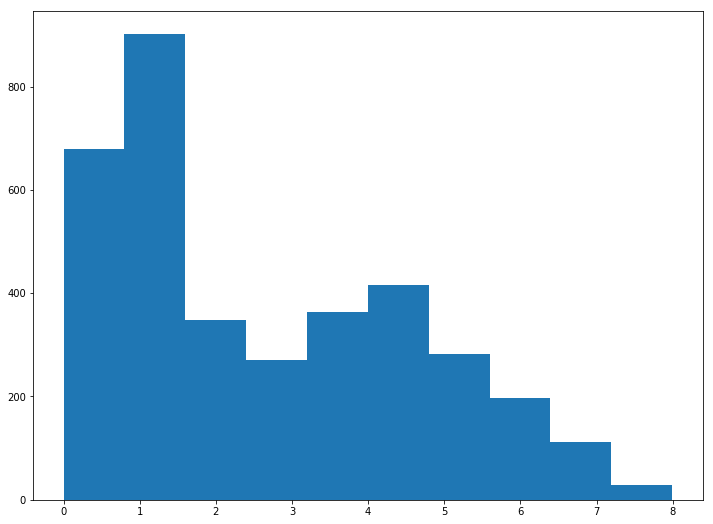

In [12]:
ten_meter_distances_laplacian = csgraph.laplacian(ten_meter_distances)


w,v = LA.eig(ten_meter_distances_laplacian)
print(v[1])
plt.hist(ten_meter_distances.flatten())

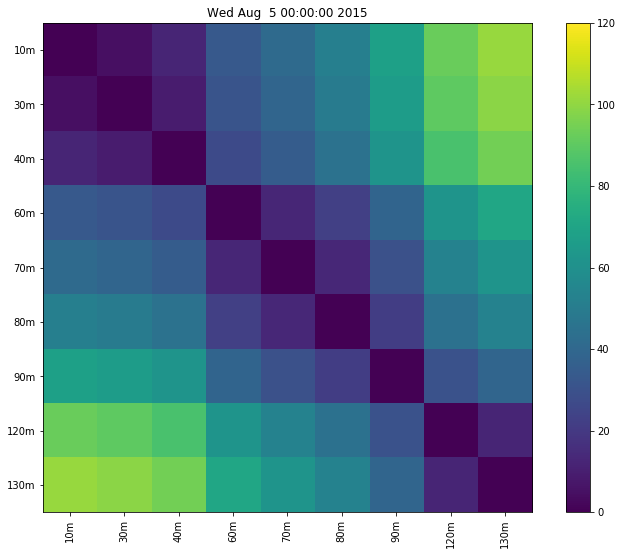

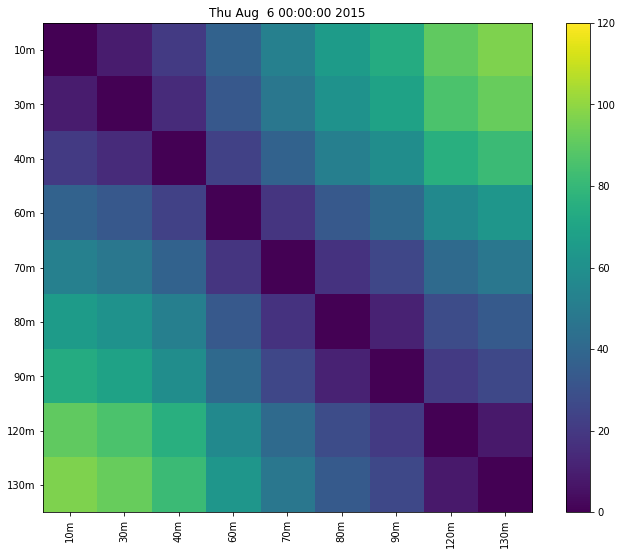

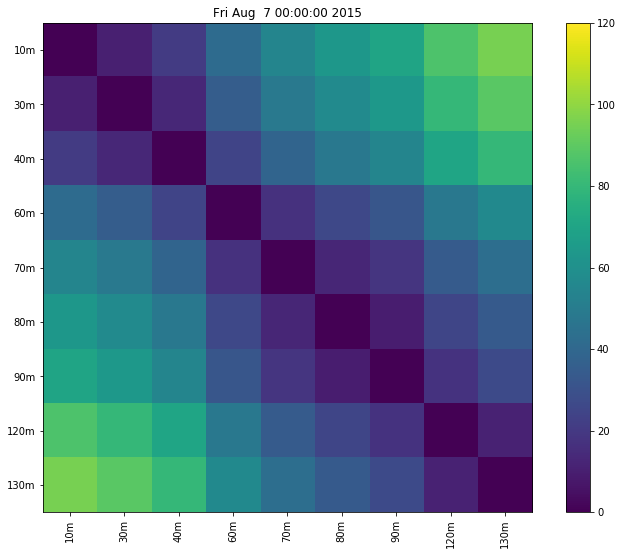

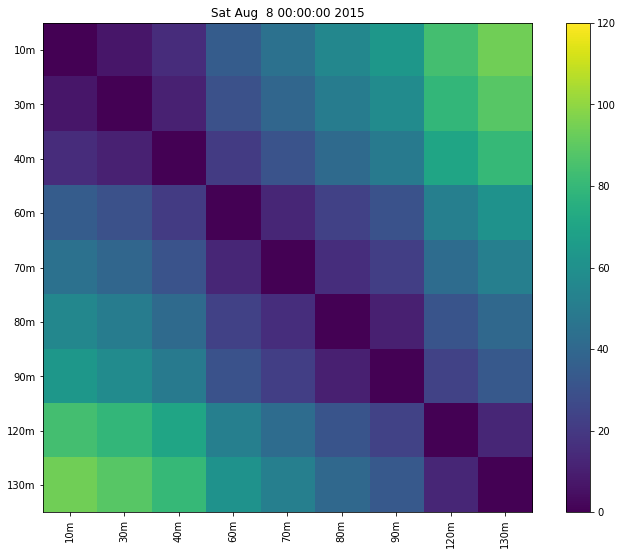

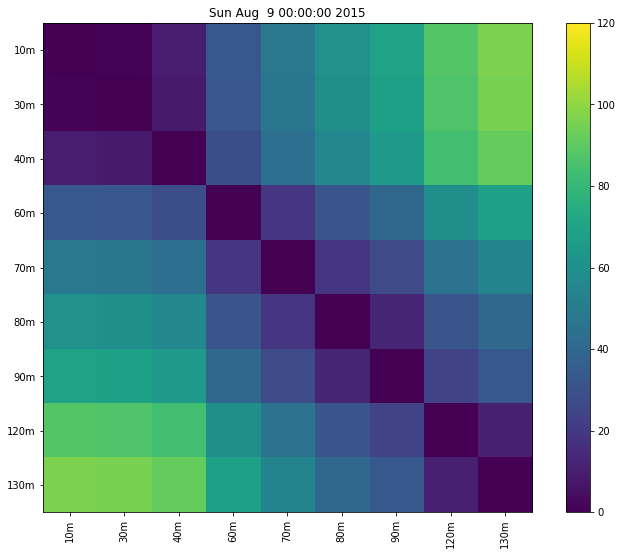

...

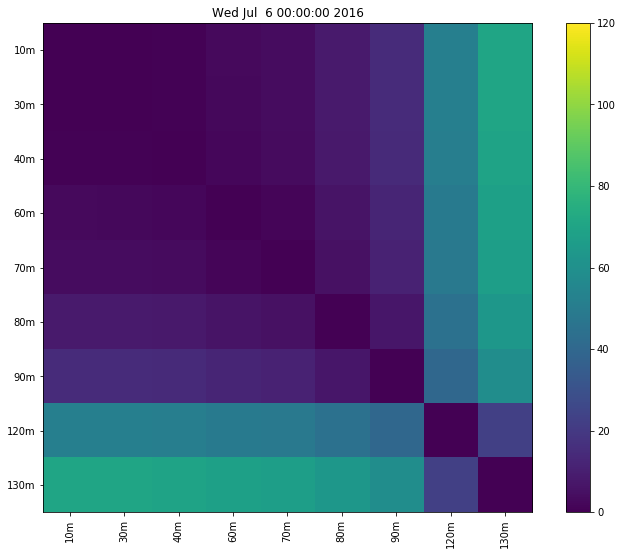

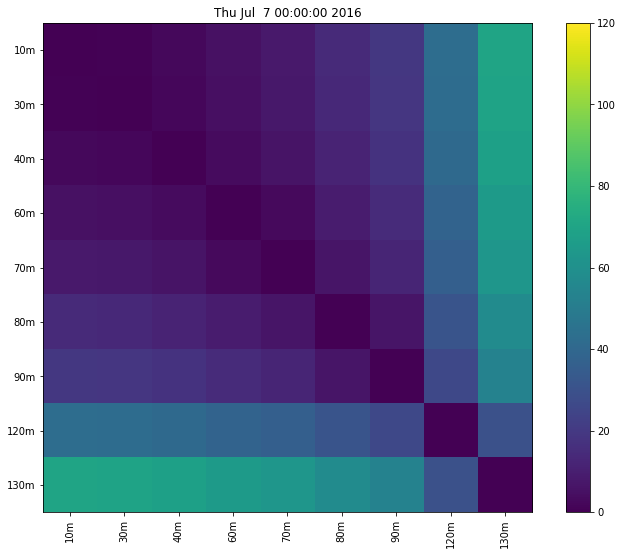

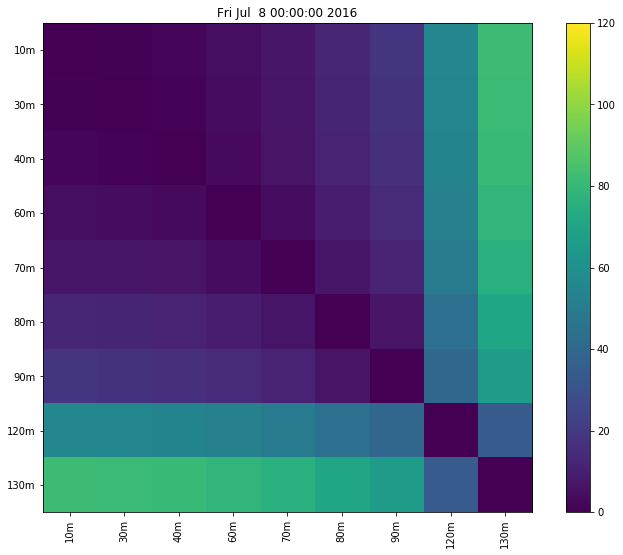

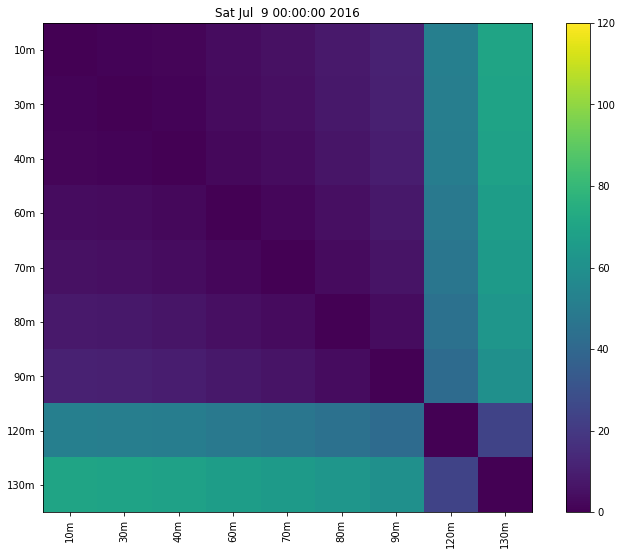

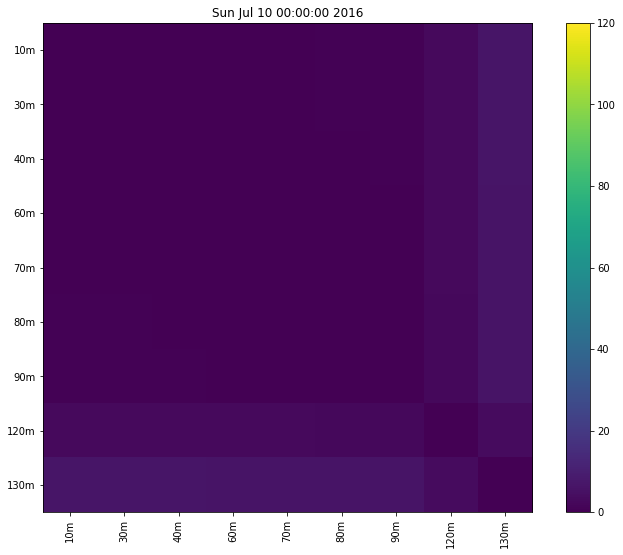

In [13]:
dist_matricies = []
for df in data_by_days:
    dist_matricies.append(analysis.distance_matrix(df.T.values))
    analysis.plotter(dist_matricies[-1],data.columns.tolist(),df.index[0].ctime())
    dist_df = pd.DataFrame({"Depth Distance": [dist_matricies[-1]]},index=df.index)

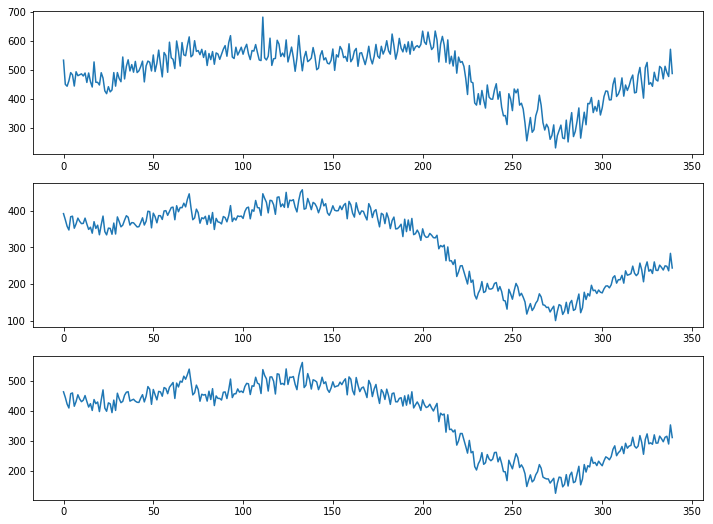

In [14]:
norm_1 = []
norm_2 = []
norm_frob =[]
for i in dist_matricies[:-1]:
    norm_1.append(LA.norm(i,1))
    norm_2.append(LA.norm(i,2))
    norm_frob.append(LA.norm(i,'fro'))

ax1 = plt.subplot(311)
plt.plot(norm_1)

ax2 = plt.subplot(312,sharex=ax1)
plt.plot(norm_2)

ax3 = plt.subplot(313,sharex=ax1)
plt.plot(norm_frob)

plt.show()

In [ ]:
plt.plot()